<a href="https://colab.research.google.com/github/KholidMaulidi/PCVK_Ganjil_2023/blob/main/Week7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Nama : Kholid Maulidi
##Kelas : 3C
##No Absen : 13
##NIM : 2141720139

In [1]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


2

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import math
from google.colab.patches import cv2_imshow
from PIL import Image as im

In [14]:
def convolution2d(image, kernel, stride, padding):

  image = np.pad(image, padding, mode='constant', constant_values=0)

  kernel_height, kernel_width = kernel.shape
  padded_height, padded_width = image.shape

  output_height = (padded_height - kernel_height) // stride + 1
  output_width = (padded_width - kernel_width) // stride + 1

  new_image = np.zeros((output_height, output_width)).astype(np.float32)

  # convolution process
  for y in range(0, output_height):
    for x in range(0, output_width):
      new_image[y][x] = np.sum(image[y * stride:y * stride + kernel_height, x * stride:x * stride + kernel_width] * kernel).astype(np.float32)

  return new_image


In [15]:
img_m = cv.imread('/content/drive/MyDrive/Images/female.tiff')
img_s = cv.resize(img_m, (0,0), fx=0.5, fy=0.5)
img_gray = cv.cvtColor(img_m, cv.COLOR_BGR2GRAY)

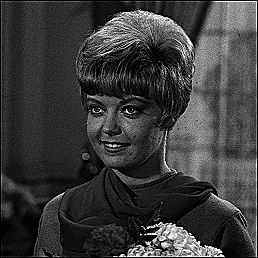

In [30]:
kernel_sharpen = np.array([[0,-1,0],
                           [-1,5,-1],
                           [0,-1,0]])
cv2_imshow(convolution2d(img_gray, kernel_sharpen,1,2))

3

emboss

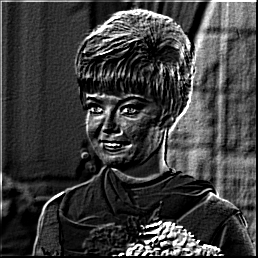

In [17]:
kernel_emboss = np.array([[-2,-1,0],
                           [-1,1,1],
                           [0,1,2]])
cv2_imshow(convolution2d(img_gray, kernel_emboss,1,2))

Left Sobel Edge Detection

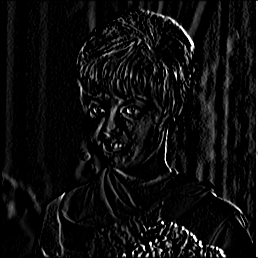

In [18]:
kernel_sobel = np.array([[1,0,-1],
                           [2,0,-2],
                           [1,0,-1]])
cv2_imshow(convolution2d(img_gray, kernel_sobel,1,2))


Canny Edge Detection

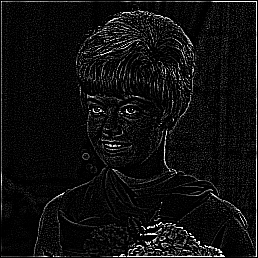

In [19]:
kernel_canny = np.array([[-1,-1,-1],
                           [-1,8,-1],
                           [-1,-1,-1]])
cv2_imshow(convolution2d(img_gray, kernel_canny,1,2))

Prewitt Edge Detection

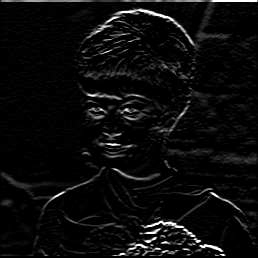

In [20]:
kernel_prewitt = np.array([[-1,-1,-1],
                           [0,0,0],
                           [1,1,1]])
cv2_imshow(convolution2d(img_gray, kernel_prewitt,1,2))


5x5 Gaussian Blur

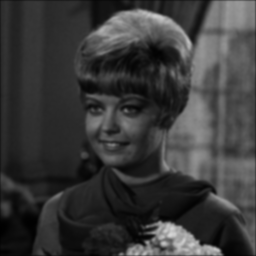

In [21]:
kernel_blur5 = np.array([[1,4,6,4,1],
                              [4,16,24,16,4],
                              [6,24,36,24,6],
                              [4,16,24,16,4],
                              [1,4,6,4,1]]) / 256
cv2_imshow(convolution2d(img_gray, kernel_blur5,1,2))

21x21 Gaussian Blur

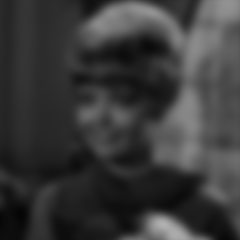

In [22]:
kernel_size = 21
sigma=math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

cv2_imshow(convolution2d(img_gray, gauss_kernel,1,2))

Tugas

In [57]:
import cv2
def Brightness (image, brightness):
  brightness_image = np.zeros(image.shape, image.dtype)

  for y in range(image.shape[0]):
    for x in range(image.shape[1]):
      for c in range(image.shape[2]):
        brightness_image[y,x,c] = np.clip(image[y,x,c] + brightness, 0, 255)

  return brightness_image

def hist_equ (image):
  channels = cv.split(image)
  eq_channels = []
  for ch, color in zip(channels, ["r", "g", "b"]):
    eq_channels.append(cv.equalizeHist(ch))

  eq_image = cv.merge(eq_channels)

  return eq_image

def adjust_contrast(image, alpha):
  adjusted_image = cv2.convertScaleAbs(image, alpha=alpha, beta=0)
  return adjusted_image

KTP 1

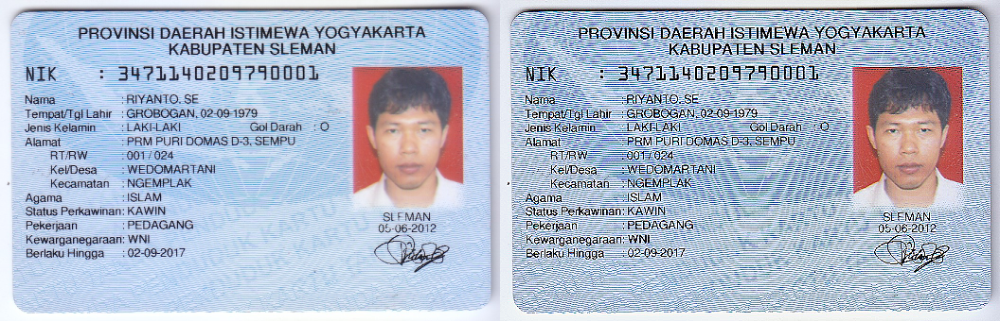

In [58]:
ktp1 = cv.imread('/content/drive/MyDrive/Images/ktp_more/ktp.png')
ktp_1 = cv.resize(ktp1, (0,0), fx=0.5, fy=0.5)
brightness = Brightness(ktp_1, -10)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp_1, result))
cv2_imshow(final_frame)

KTP 2

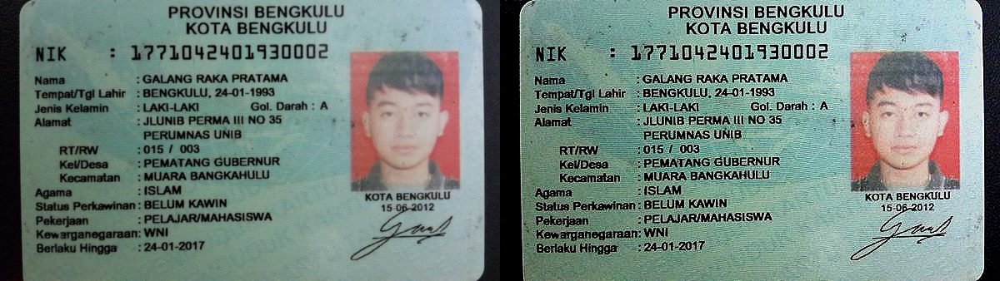

In [66]:
ktp2 = cv.imread('/content/drive/MyDrive/Images/ktp_more/ktp1.png')
contrast = adjust_contrast(ktp2, 1.3)
brightness = Brightness(contrast, -30)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp2, result))
cv2_imshow(final_frame)


KTP 3

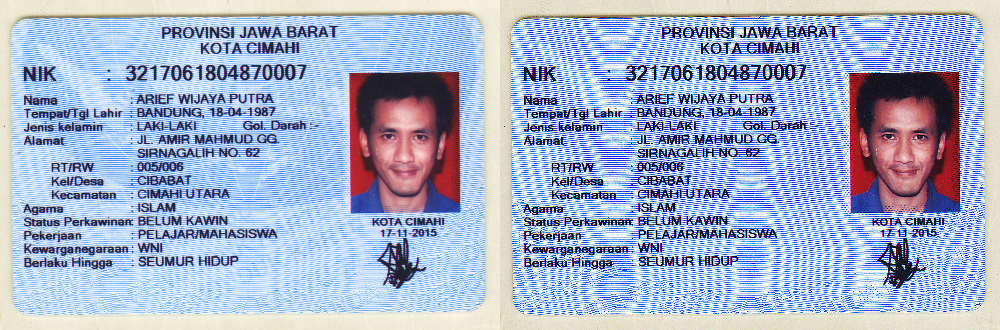

In [62]:
ktp3 = cv.imread('/content/drive/MyDrive/Images/ktp_more/ktp2.png')
brightness = Brightness(ktp3, -10)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp3, result))
cv2_imshow(final_frame)


KTP 4

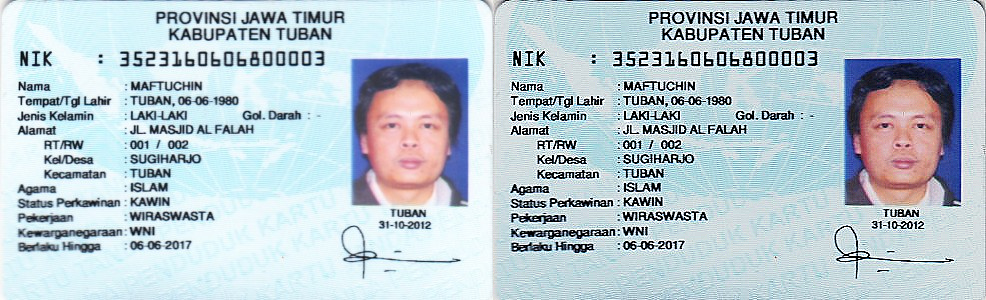

In [63]:
ktp4 = cv.imread('/content/drive/MyDrive/Images/ktp_more/ktp3.png')
brightness = Brightness(ktp4, -30)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp4, result))
cv2_imshow(final_frame)

KTP 5

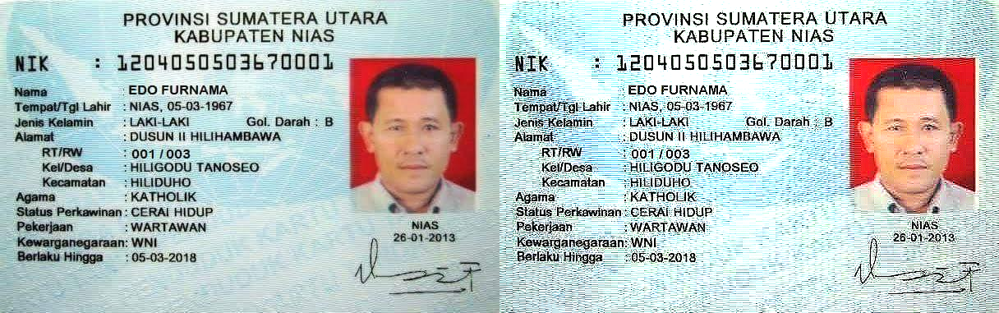

In [68]:
ktp5 = cv.imread('/content/drive/MyDrive/Images/ktp_more/ktp5.png')
contrast = adjust_contrast(ktp5, 1.2)
brightness = Brightness(result, -30)
result = cv2.filter2D(contrast, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp5, result))
cv2_imshow(final_frame)

KTP 6

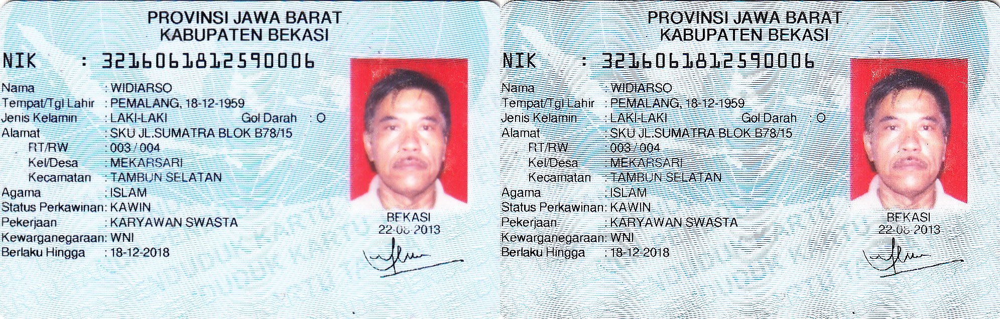

In [70]:
ktp6 = cv.imread('/content/drive/MyDrive/Images/ktp_more/ktp6.png')
result = cv2.filter2D(ktp6, -1, kernel_sharpen)
brightness = Brightness(result, -30)
final_frame = cv.hconcat((ktp6, result))
cv2_imshow(final_frame)

KTP 7

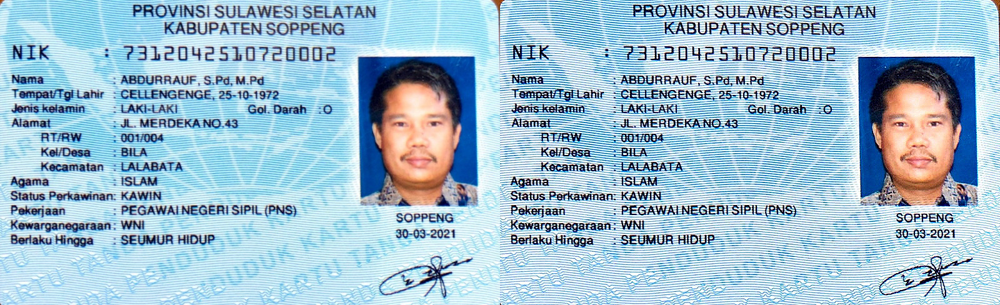

In [72]:
ktp7 = cv.imread('/content/drive/MyDrive/Images/ktp_more/ktp7.jpeg')
result = cv2.filter2D(ktp7, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp7, result))
cv2_imshow(final_frame)